# How to apply CNN models on Custom Build Datasets

### The Dataset Link
https://www.kaggle.com/sanikamal/horses-or-humans-dataset

# The biggest Problem: Data or Image LABELLING.

# Tensorflow Solution: ImageDataGenerator

In [1]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# train_data: is an instance on the ImageDataGenerator

In [2]:
train_data = ImageDataGenerator(rescale = 1/255)

# flow_from_directory method on class ImageDataGenerator takes the path to a directory and generates batches.

In [3]:
train_generator = train_data.flow_from_directory(
                    'horse-or-human/train/',
                    target_size = (300,300),
                    class_mode = 'binary'
)

Found 1027 images belonging to 2 classes.


## A DirectoryIterator yielding tuples of (x, y) where x is a numpy array containing a batch of images with shape (batch_size, *target_size, channels) and y is a numpy array of corresponding labels.

# Class_Mode is Binary for dual sets, Multiple sets will have a class_mode of type 'categorical'.

##### Constraint in using this Solution: The Directory Structure is Specified as
# Root Dir-->Train ----> Horses -------->*.jpg
#   |                  |
#   |                  |---------> Humans-------->*.jpg
#   |
#   |
#   |------->Validate ---------> horses-------->*.jpg
#                   |
#                   |--------------> Humans-------->*.jpg

### Lets Build a CNN Model for This Dataset

In [4]:
import tensorflow as tf

In [5]:
model = tf.keras.Sequential([
            tf.keras.layers.Conv2D(16,(3,3),activation = 'relu', input_shape = (300,300,3)),
            tf.keras.layers.MaxPooling2D(2,2),
            tf.keras.layers.Conv2D(32,(3,3), activation = 'relu'),
            tf.keras.layers.MaxPooling2D(2,2),
            tf.keras.layers.Conv2D(64,(3,3), activation = 'relu'),
            tf.keras.layers.MaxPooling2D(2,2),
            tf.keras.layers.Conv2D(64,(3,3), activation = 'relu'),
            tf.keras.layers.MaxPooling2D(2,2),
            tf.keras.layers.Conv2D(64,(3,3), activation = 'relu'),
            tf.keras.layers.MaxPooling2D(2,2),
            tf.keras.layers.Flatten(),
            tf.keras.layers.Dense(512, activation = 'relu'),
            tf.keras.layers.Dense(1, activation = 'sigmoid')
])

In [6]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 298, 298, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 149, 149, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 147, 147, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 73, 73, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 71, 71, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 35, 35, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 33, 33, 64)        3

In [7]:
#tf.keras.utils.plot_model(model, show_shapes = True)

In [8]:
model.compile(optimizer='sgd', loss = 'binary_crossentropy', metrics = ['accuracy'])

In [9]:
#history = model.fit_generator(train_generator, epochs = 5)

# Validation Vs Testing ---> Whats the Difference???
## Training Data ---> To teach the network to fit data to labels.
## Validation ---> To Check the network's performance while training with previously Unseen Data to inspect the fitting process.
### Testing ----> Inferencing on the previously Unseen Data.

In [10]:
validation_datagen = ImageDataGenerator(rescale = 1/255)
validate_generator = validation_datagen.flow_from_directory(
                    'horse-or-human/validation/',
                    target_size = (300,300),
                    class_mode = 'binary'
)

Found 256 images belonging to 2 classes.


# Incorporate Validation Generator into the training process.

In [11]:
history = model.fit(train_generator, epochs = 1, validation_data = validate_generator)

33/33 [==============================] - 13s 197ms/step - loss: 0.6901 - accuracy: 0.5190 - val_loss: 0.6897 - val_accuracy: 0.5000


# How to Test this Trained Model?

### Predicting Images from Test Data

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras.preprocessing import image
X1 = []
path = 'Test_Images' 
img_list = os.listdir(path)
for img in img_list:
    img_test = image.load_img(path+'/'+img, target_size=(300,300))
    x = image.img_to_array(img_test)
    x = np.expand_dims(x, axis=0)
    X1.append(x)
X11 = np.array(X1)

In [13]:
# Select an image You want to Test (Max value = 30)
i = 3
X11[i]
img_list[i]
img_show = image.load_img(path+'/'+img_list[i], target_size=(300,300))

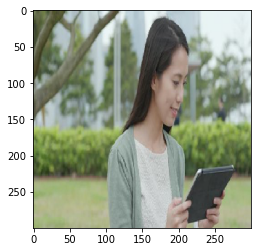

In [14]:
image_tensor = np.vstack([X11[i]])
## Images stacked Vertically to mimic the shape of training data
plt.imshow(img_show)

classes = model.predict(image_tensor)

if classes[0]>0.5:
    print(img_list[i] + " is human")
else:
    print(img_list[i] + " is a horse")

## Why My Model is predicting h11 as a horse?

# Less Training 
## Less Variety of Training Data
### How to Increse the Variety of training data when we have less data?

In [15]:
import numpy as np
import random
from tensorflow.keras.preprocessing.image import img_to_array, load_img
import tensorflow

In [16]:
# Get list of layers from Model
layers_outputs = [layer.output for layer in model.layers[1:]]

In [17]:
layers_outputs

[<KerasTensor: shape=(None, 149, 149, 16) dtype=float32 (created by layer 'max_pooling2d')>,
 <KerasTensor: shape=(None, 147, 147, 32) dtype=float32 (created by layer 'conv2d_1')>,
 <KerasTensor: shape=(None, 73, 73, 32) dtype=float32 (created by layer 'max_pooling2d_1')>,
 <KerasTensor: shape=(None, 71, 71, 64) dtype=float32 (created by layer 'conv2d_2')>,
 <KerasTensor: shape=(None, 35, 35, 64) dtype=float32 (created by layer 'max_pooling2d_2')>,
 <KerasTensor: shape=(None, 33, 33, 64) dtype=float32 (created by layer 'conv2d_3')>,
 <KerasTensor: shape=(None, 16, 16, 64) dtype=float32 (created by layer 'max_pooling2d_3')>,
 <KerasTensor: shape=(None, 14, 14, 64) dtype=float32 (created by layer 'conv2d_4')>,
 <KerasTensor: shape=(None, 7, 7, 64) dtype=float32 (created by layer 'max_pooling2d_4')>,
 <KerasTensor: shape=(None, 3136) dtype=float32 (created by layer 'flatten')>,
 <KerasTensor: shape=(None, 512) dtype=float32 (created by layer 'dense')>,
 <KerasTensor: shape=(None, 1) dtype

In [18]:
# Create Visualization model
visualize_model = tensorflow.keras.models.Model(inputs = model.input, outputs = layers_outputs)

In [19]:
visualize_model

In [20]:
x = img_to_array(img_show)

In [21]:
x.shape

(300, 300, 3)

In [22]:
x = x.reshape((1,300,300,3))

In [23]:
x /= 255

In [24]:
# Get all layers feature maps for this image
feature_maps = visualize_model.predict(x)
print(len(feature_maps))

12


In [25]:
# Show names of layers available in the model
layer_names = [layer.name for layer in model.layers]
print(layer_names)

['conv2d', 'max_pooling2d', 'conv2d_1', 'max_pooling2d_1', 'conv2d_2', 'max_pooling2d_2', 'conv2d_3', 'max_pooling2d_3', 'conv2d_4', 'max_pooling2d_4', 'flatten', 'dense', 'dense_1']


In [26]:
import matplotlib.pyplot as plt
%matplotlib inline

(1, 149, 149, 16)
(1, 147, 147, 32)


<ipython-input-27-918b3a65fa9d>:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(scale*channels, scale))
<ipython-input-27-918b3a65fa9d>:10: RuntimeWarning: invalid value encountered in true_divide
  x /= x.std()


(1, 73, 73, 32)
(1, 71, 71, 64)
(1, 35, 35, 64)
(1, 33, 33, 64)
(1, 16, 16, 64)
(1, 14, 14, 64)
(1, 7, 7, 64)
(1, 3136)
(1, 512)
(1, 1)


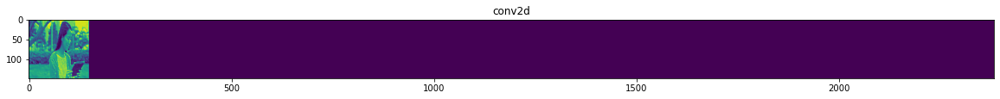

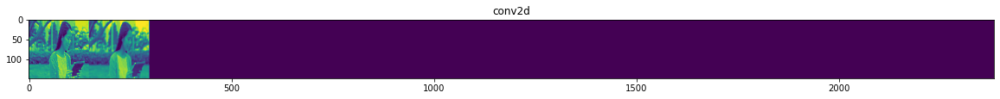

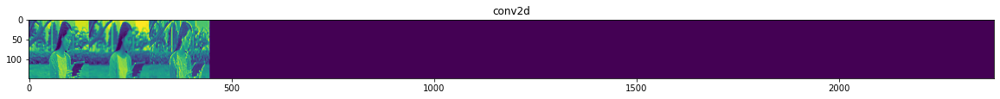

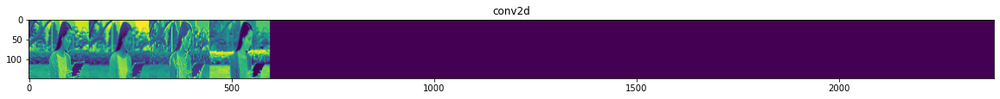

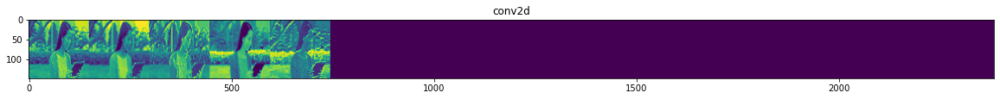

...

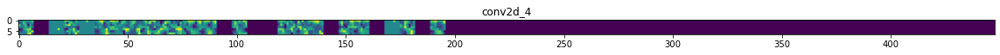

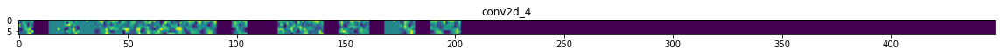

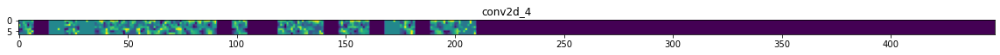

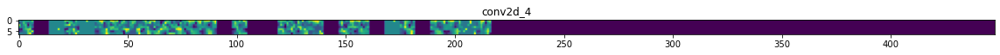

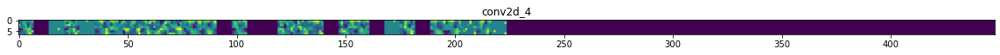

In [ ]:
for layer_names, feature_maps in zip(layer_names, feature_maps):
    print(feature_maps.shape)
    if len(feature_maps.shape) == 4:
        channels = feature_maps.shape[-1]
        size = feature_maps.shape[1]
        display_grid = np.zeros((size,size*channels))
        for i in range(channels):
            x = feature_maps[0,:,:,i]
            x -= x.mean()
            x /= x.std()
            x *= 64
            x += 128
            x = np.clip(x,0,255).astype('uint8')
            # tile each filter into a big horizontal grid
            display_grid[:,i*size:(i+1)*size] = x
            
            scale = 20./channels
            plt.figure(figsize=(scale*channels, scale))
            plt.title(layer_names)
            plt.grid(False)
            plt.imshow(display_grid, aspect = 'auto', cmap = 'viridis')

In [ ]:
x